# IMPORTANDO LAS LIBRERIAS NECESARIAS

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('whitegrid')
import matplotlib.pyplot as plt
plt.style.use("fivethirtyeight")
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, max_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
import optuna
from keras.models import Sequential
from keras.callbacks import EarlyStopping
from keras.layers import Dense, LSTM, Dropout
from tensorflow.keras.layers import Dropout, BatchNormalization
from sklearn.preprocessing import MinMaxScaler

# CARGANDO LOS DATOS

In [2]:
data_dir = 'https://raw.githubusercontent.com/GuztavoZimmIA/PrediccionDeTemperatura/refs/heads/main/DATASET/Temp_Asu20092021.csv'
df = pd.read_csv(data_dir)

# EXPLORACION DE DATOS

In [3]:
df.head()

,Unnamed: 0,Fecha,Temperatura,Humedad
0,0,2009-01-01 00:00:00,26.749483,69.609451
1,1,2009-01-01 03:00:00,25.956114,78.225166
2,2,2009-01-01 06:00:00,23.707357,93.551756
3,3,2009-01-01 09:00:00,23.726823,93.394817
4,4,2009-01-01 12:00:00,29.606379,72.155839


In [4]:
df.tail()

,Unnamed: 0,Fecha,Temperatura,Humedad
37979,37979,2021-12-31 09:00:00,21.719499,85.092387
37980,37980,2021-12-31 12:00:00,29.548918,53.780205
37981,37981,2021-12-31 15:00:00,40.026148,27.392646
37982,37982,2021-12-31 18:00:00,41.244712,19.955186
37983,37983,2021-12-31 21:00:00,37.645491,22.674331


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37984 entries, 0 to 37983
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Unnamed: 0   37984 non-null  int64  
 1   Fecha        37984 non-null  object 
 2   Temperatura  37984 non-null  float64
 3   Humedad      37984 non-null  float64
dtypes: float64(2), int64(1), object(1)
memory usage: 1.2+ MB


In [6]:
df.describe()

,Unnamed: 0,Temperatura,Humedad
count,37984.000000,37984.000000,37984.000000
mean,18991.500000,23.331851,69.582766
std,10965.180649,7.010674,21.241159
min,0.000000,0.816554,11.362540
25%,9495.750000,18.828069,53.176771
50%,18991.500000,23.415079,72.034901
75%,28487.250000,28.012269,88.568312
max,37983.000000,45.408000,113.593546


### Dando formato a la columna de Fecha

In [7]:
df['Fecha'] = pd.to_datetime(df['Fecha'])


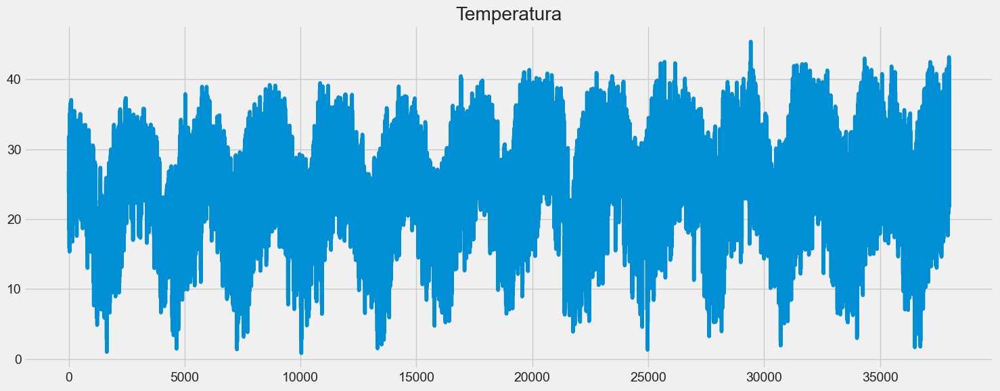

In [8]:
plt.figure(figsize=(15, 6))
df['Temperatura'].plot()
plt.ylabel(None)
plt.xlabel(None)
plt.title("Temperatura")
plt.tight_layout()
plt.show()

# ANALISIS DE DATOS


### TEMPERATURA PROMEDIO POR MES

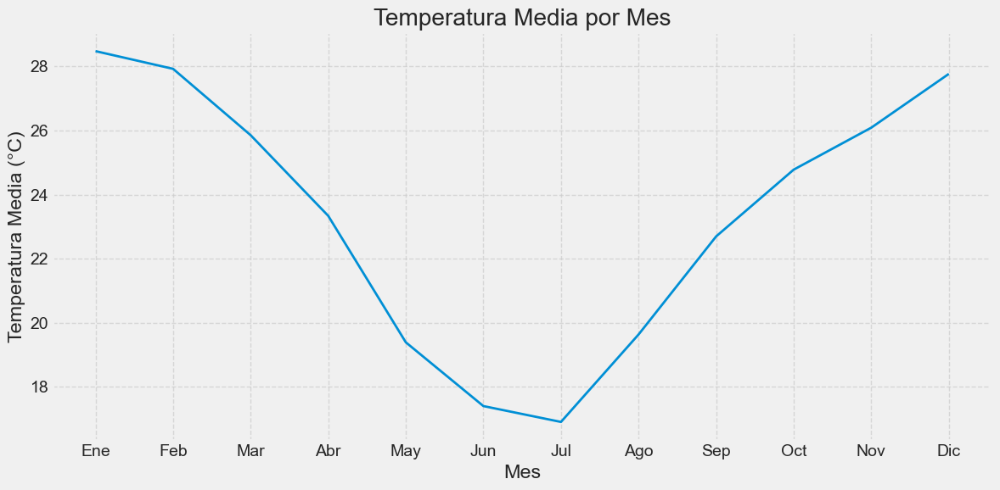

In [9]:
# Reorganizar los datos para graficar todos los años en un mismo gráfico con el eje horizontal como meses
df['Mes'] = df['Fecha'].dt.month
df['Año'] = df['Fecha'].dt.year

# Calcular el promedio de temperaturas por mes considerando todos los años
mean_temp_by_month = df.groupby('Mes')['Temperatura'].mean()

# Graficar
plt.figure(figsize=(12, 6))
plt.plot(mean_temp_by_month.index, mean_temp_by_month.values, linewidth=2)
plt.title('Temperatura Media por Mes')
plt.xlabel('Mes')
plt.ylabel('Temperatura Media (°C)')
plt.xticks(range(1, 13), ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic'])
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()



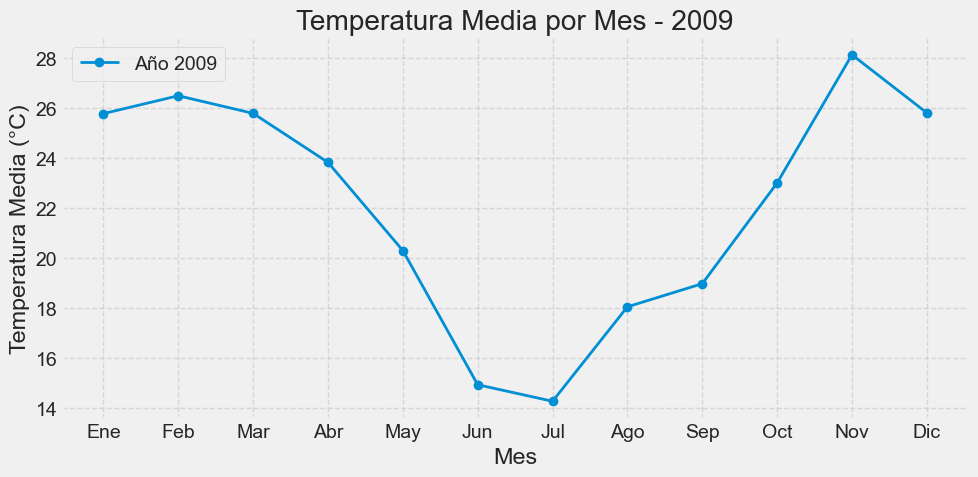

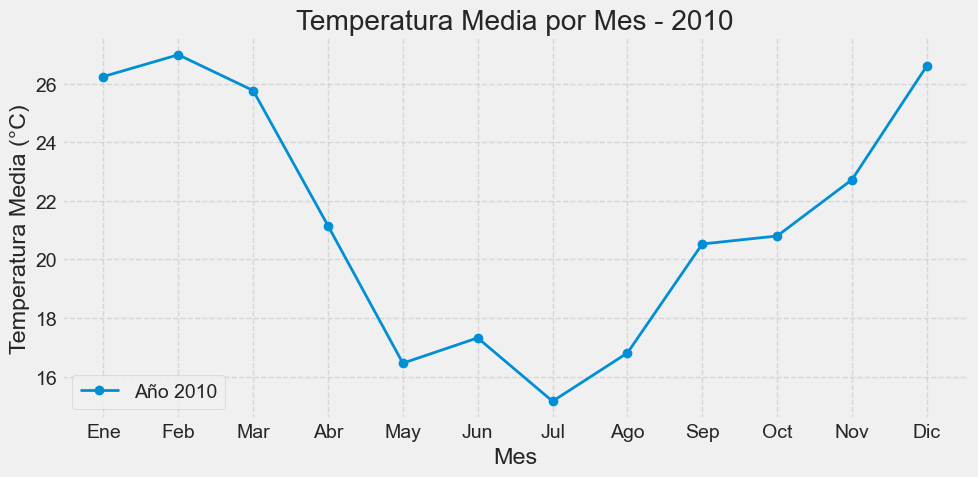

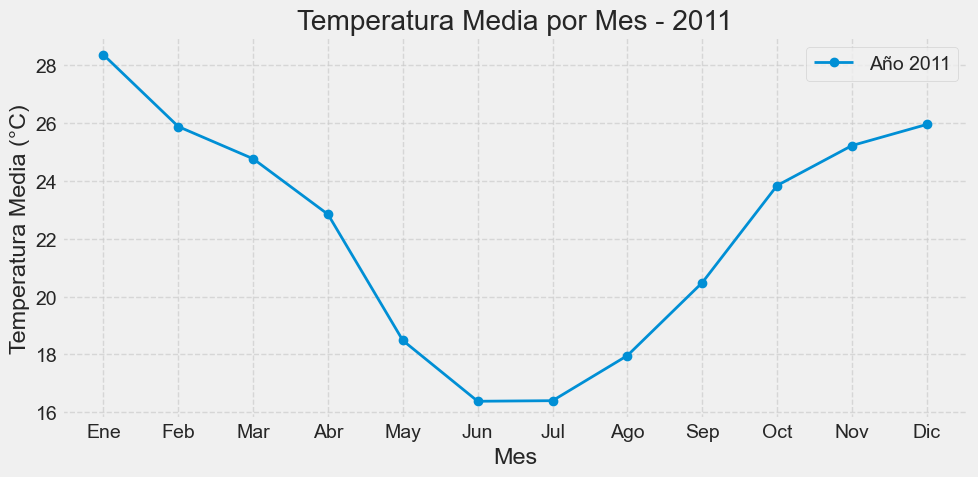

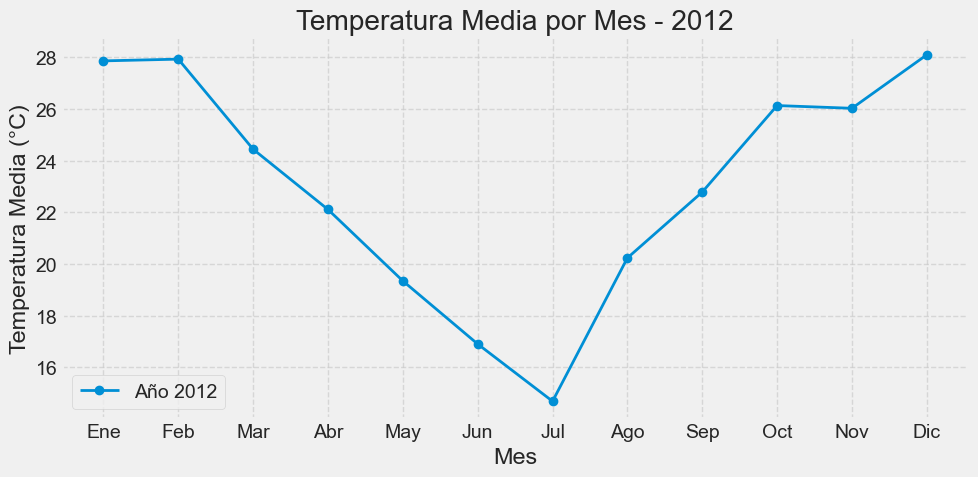

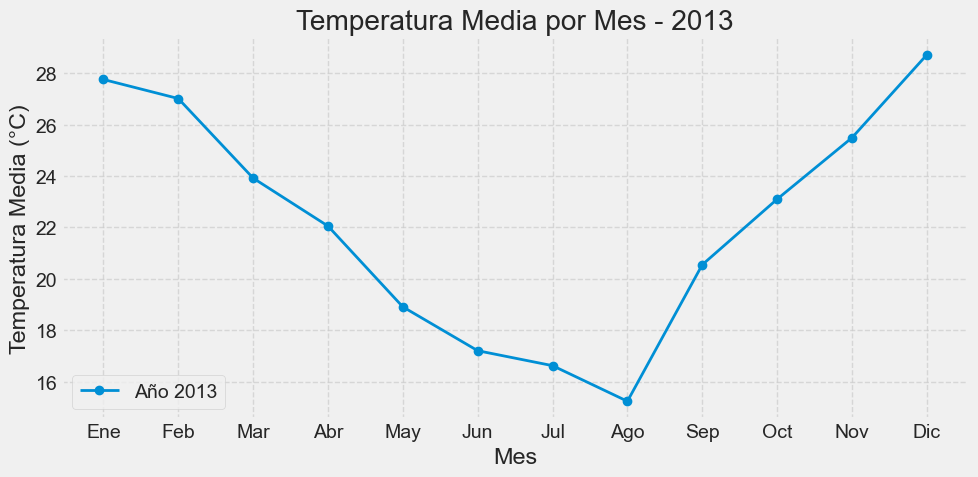

...

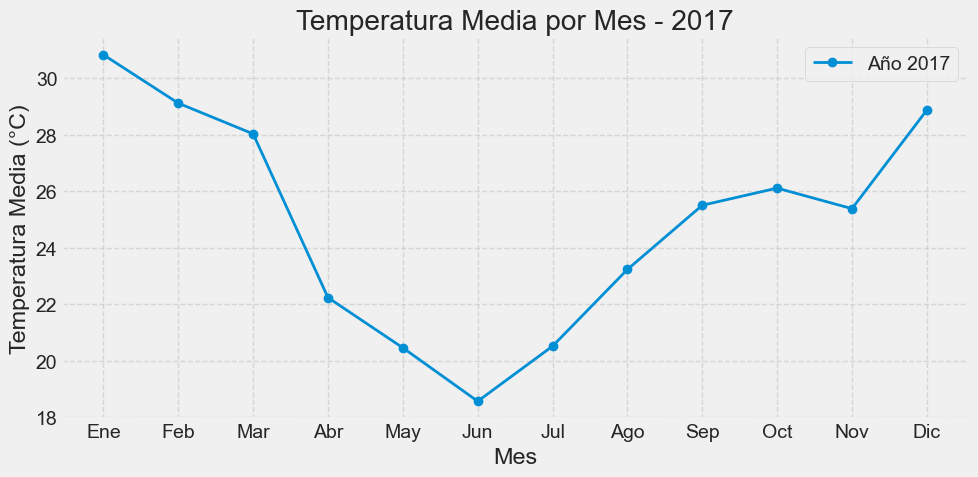

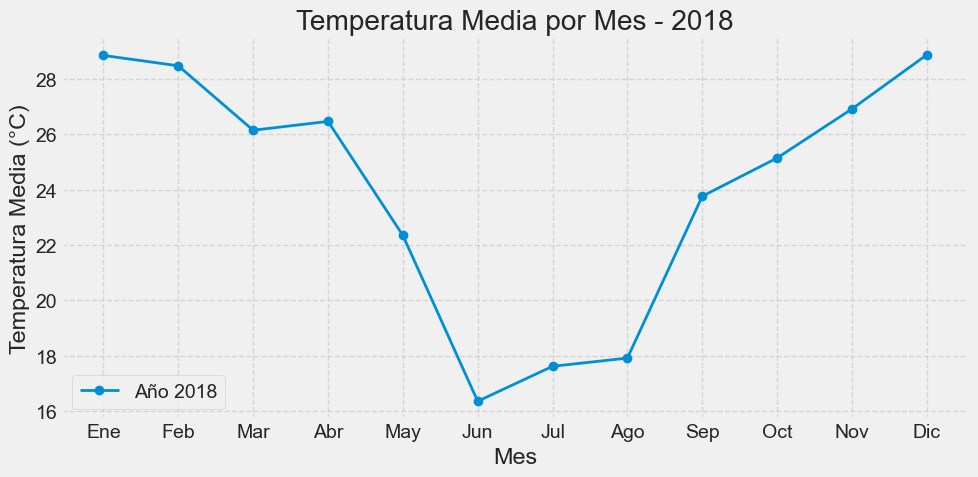

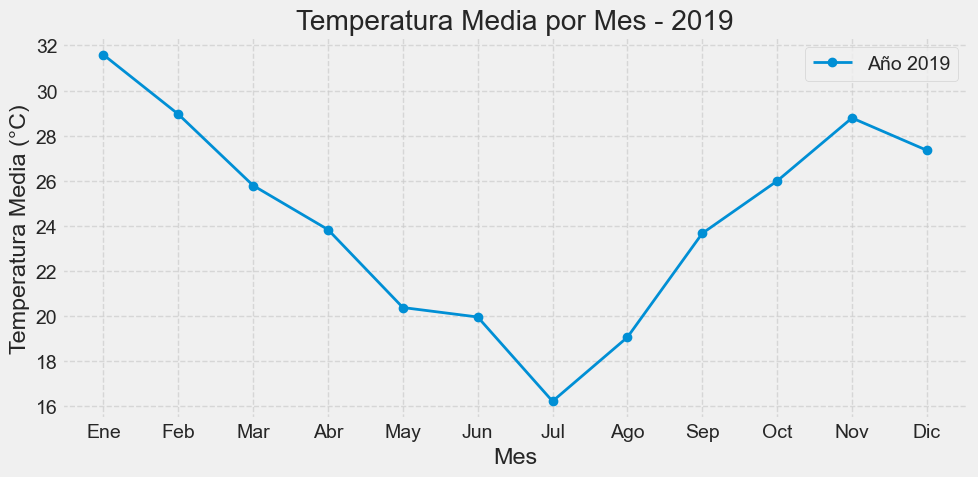

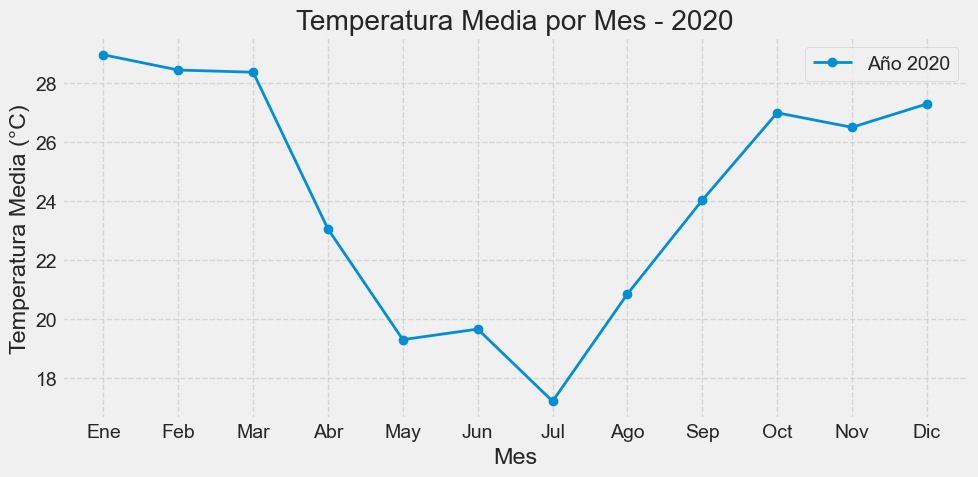

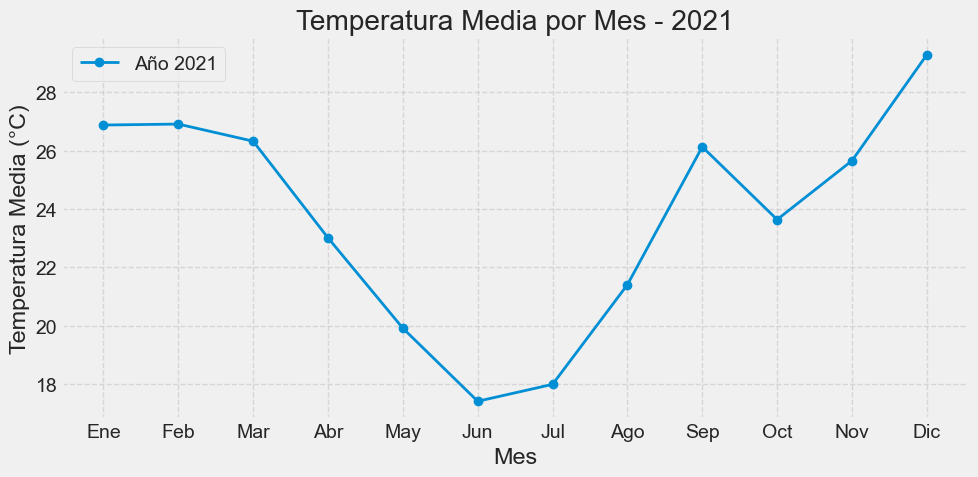

In [10]:
unique_years = df['Año'].unique()

for year in unique_years:
    yearly_data = df[df['Año'] == year].groupby('Mes')['Temperatura'].mean()
    
    plt.figure(figsize=(10, 5))
    plt.plot(yearly_data.index, yearly_data.values, marker='o', linewidth=2, label=f'Año {year}')
    plt.title(f'Temperatura Media por Mes - {year}')
    plt.xlabel('Mes')
    plt.ylabel('Temperatura Media (°C)')
    plt.xticks(range(1, 13), ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic'])
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.show()

Se puede ver que en invierno la temperatura disminuye.

### COMPARANDO HUMEDAD Y TEMPERATURA

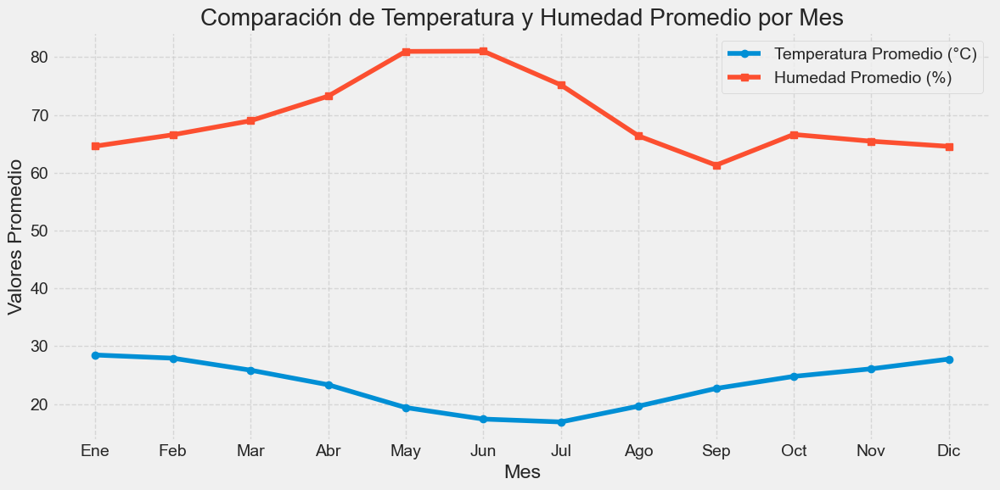

In [11]:
# Calcular la temperatura y humedad promedio por mes
df['Mes'] = df['Fecha'].dt.month
temp_hum = df.groupby('Mes')[['Temperatura', 'Humedad']].mean().reset_index()

# Gráfica
plt.figure(figsize=(12, 6))
plt.plot(temp_hum['Mes'], temp_hum['Temperatura'], label='Temperatura Promedio (°C)', marker='o')
plt.plot(temp_hum['Mes'], temp_hum['Humedad'], label='Humedad Promedio (%)', marker='s')
plt.title('Comparación de Temperatura y Humedad Promedio por Mes')
plt.xlabel('Mes')
plt.ylabel('Valores Promedio')
plt.xticks(range(1, 13), ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic'])
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


# PROCESAMIENTO DE DATOS

### CONFIGURANDO DATOS PARA LTMS


In [12]:
n_cols = 1
dataset = df["Temperatura"]
dataset = pd.DataFrame(dataset)
data = dataset.values

data.shape

(37984, 1)

In [13]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range= (0, 1))
scaled_data = scaler.fit_transform(np.array(data))

In [14]:
train_size = int(len(data) * 0.75)
test_size = len(data) - train_size
print("Train Size :",train_size,"Test Size :",test_size)

Train Size : 28488 Test Size : 9496


In [15]:
train_data = scaled_data[0:train_size, :]
train_data.shape

(28488, 1)

In [16]:
# Creating a Training set with 60 time-steps
x_train = []
y_train = []
time_steps = 60
n_cols = 1

for i in range(time_steps, len(scaled_data)):
    x_train.append(scaled_data[i-time_steps:i, :n_cols])
    y_train.append(scaled_data[i, :n_cols])

In [17]:
# Convert to numpy array
x_train, y_train = np.array(x_train), np.array(y_train)

In [18]:
# Reshaping the input to (n_samples, time_steps, n_feature)
x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], n_cols))

In [19]:
x_train.shape , y_train.shape

((37924, 60, 1), (37924, 1))

In [20]:
from sklearn.model_selection import train_test_split

# Dividir en entrenamiento y validación
x_train, x_val, y_train, y_val = train_test_split(
    x_train, y_train, test_size=0.2, random_state=42
)


In [21]:
time_steps = 60
test_data = scaled_data[train_size - time_steps:, :]

x_test = []
y_test = []
n_cols = 1

for i in range(time_steps, len(test_data)):
    x_test.append(test_data[i-time_steps:i, 0:n_cols])
    y_test.append(test_data[i, 0:n_cols])
x_test, y_test = np.array(x_test), np.array(y_test)
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], n_cols))

# Modelo LSTM

### Estructura del modelo

In [ ]:

model = Sequential([
    LSTM(50, return_sequences=True, input_shape=(x_train.shape[1], n_cols)),
    Dropout(0.2),  # Reduce el sobreajuste
    LSTM(64, return_sequences=False),
    Dropout(0.2),
    Dense(32, activation='relu'),
    BatchNormalization(),  # Normaliza las activaciones
    Dense(16, activation='relu'),
    Dense(n_cols)  # Capa de salida
])

model.compile(optimizer='adam', loss='mse', metrics=['mean_absolute_error'])



In [24]:
import tensorflow.keras.backend as K

# Definir RMSE como métrica personalizada
def rmse(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# Definir R² como métrica personalizada
def r2_score(y_true, y_pred):
    total_error = K.sum(K.square(y_true - K.mean(y_true)))
    residual_error = K.sum(K.square(y_true - y_pred))
    return 1 - (residual_error / total_error)

# Compilar el modelo con las nuevas métricas
model.compile(optimizer='adam', loss='mse', metrics=['mean_absolute_error', rmse, r2_score])


In [25]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 60, 50)         │        10,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 60, 50)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 64)             │        29,440 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 42,593 (166.38 KB)

 Trainable params: 42,529 (166.13 KB)

 Non-trainable params: 64 (256.00 B)

### Entrenamiento

In [ ]:


early_stopping = EarlyStopping(
    monitor='val_loss',  # Métrica a monitorear
    patience=15,          # Número de épocas sin mejora antes de detener
    restore_best_weights=True  # Restaurar los mejores pesos
)

history = model.fit(
    x_train, y_train,
    validation_data=(x_val, y_val),
    epochs=100,
    batch_size=32,
    callbacks=[early_stopping],  # Agregar el callback
    verbose=1
)


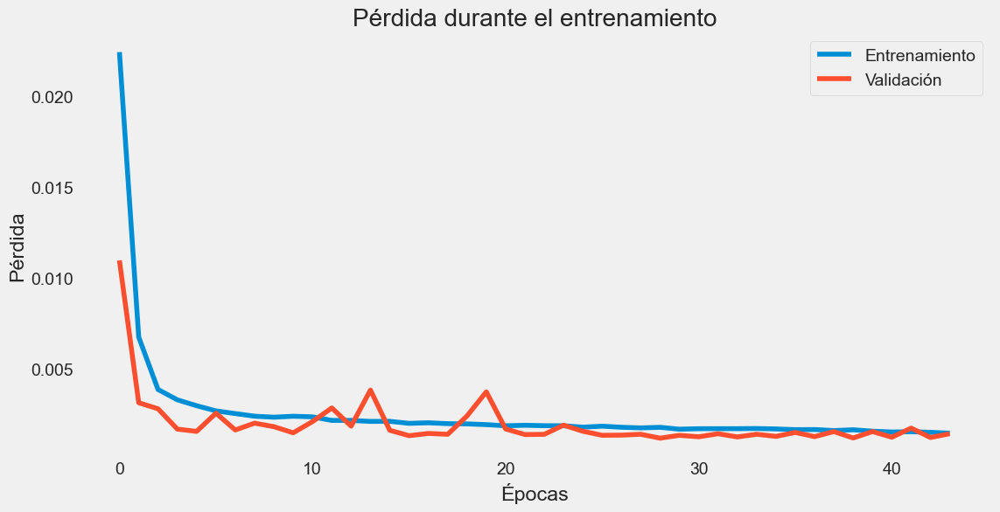

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Entrenamiento')
plt.plot(history.history['val_loss'], label='Validación')
plt.title('Pérdida durante el entrenamiento')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.legend()
plt.grid()
plt.show()


### Evaluacion

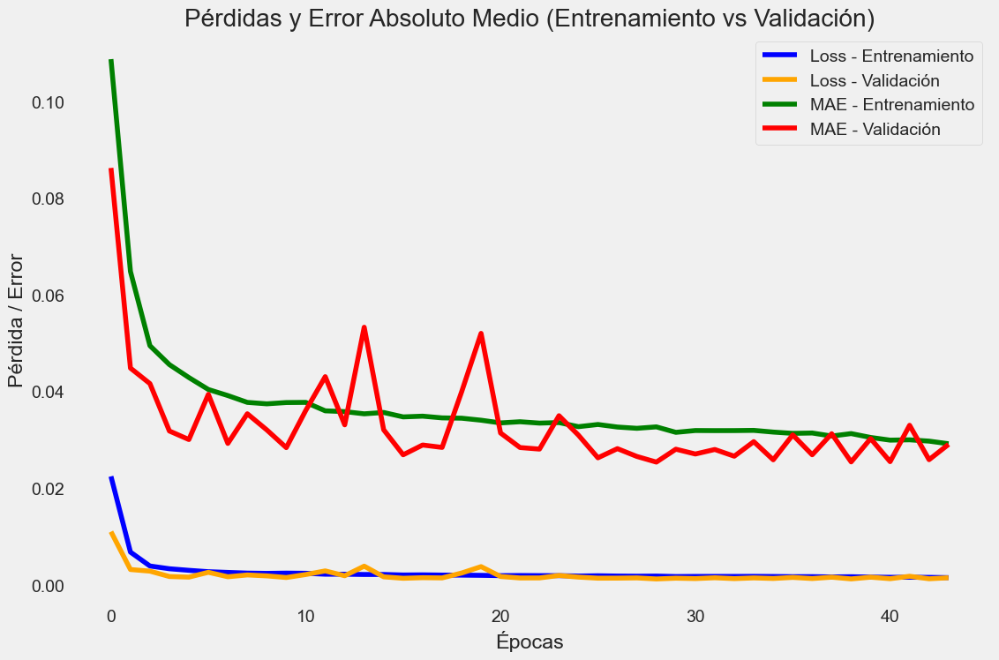

In [ ]:
plt.figure(figsize=(12, 8))
plt.plot(history.history["loss"], label="Loss - Entrenamiento", color="blue")
plt.plot(history.history["val_loss"], label="Loss - Validación", color="orange")
plt.plot(history.history["mean_absolute_error"], label="MAE - Entrenamiento", color="green")
plt.plot(history.history["val_mean_absolute_error"], label="MAE - Validación", color="red")
plt.title("Pérdidas y Error Absoluto Medio (Entrenamiento vs Validación)")
plt.xlabel("Épocas")
plt.ylabel("Pérdida / Error")
plt.legend()
plt.grid()
plt.show()


In [ ]:
# Después de entrenar tu modelo LSTM
import joblib                                                        # Para guardar y cargar modelos de scikit-learn
import os                                                            # Para operaciones con el sistema de archivos
import io    

model.save('lstm_Gustavo.h5')


In [ ]:
model.save('lstm_Gustavo.keras')

In [ ]:
import os

# Obtener el directorio de trabajo actual
current_directory = os.getcwd()
print(f"El directorio de trabajo actual es: {current_directory}")


El directorio de trabajo actual es: c:\Users\Mathias\Downloads


## PREDICCIÓN

### Datos de prueba

In [ ]:
# Get Prediction
predictions = model.predict(x_test)

297/297 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step


In [ ]:
predictions.shape

(9496, 1)

In [ ]:
#inverse predictions scaling
predictions = scaler.inverse_transform(predictions)
predictions.shape

(9496, 1)

### RMSE

In [ ]:
#inverse y_test scaling
y_test = scaler.inverse_transform(y_test)

In [ ]:
RMSE = np.sqrt(np.mean( y_test - predictions )**2).round(2)
RMSE

1.26

In [ ]:
preds_acts = pd.DataFrame(data={'Predictions':predictions.flatten(), 'Actuals':y_test.flatten()})
preds_acts

,Predictions,Actuals
0,28.818737,30.098930
1,26.563789,24.963581
2,22.292841,21.271733
3,18.308994,19.939433
4,20.365238,18.228108
...,...,...
9491,19.223701,21.719499
9492,27.406137,29.548918
9493,36.500336,40.026148
9494,38.725834,41.244712


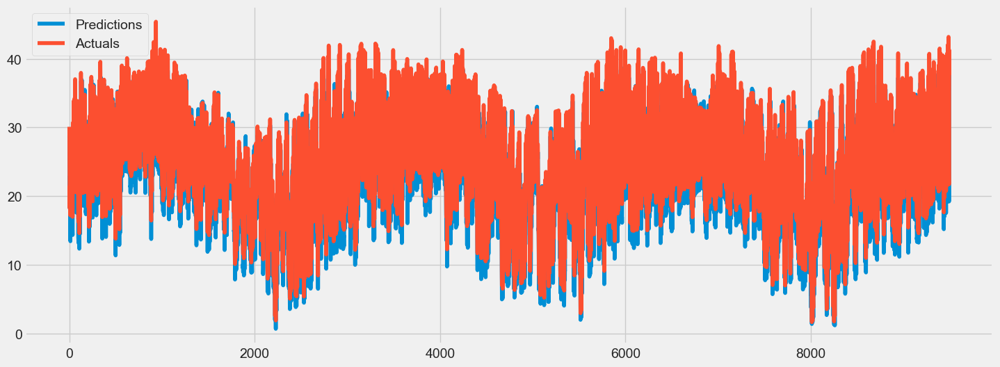

In [ ]:
plt.figure(figsize = (16, 6))
plt.plot(preds_acts['Predictions'])
plt.plot(preds_acts['Actuals'])
plt.legend(['Predictions', 'Actuals'])
plt.show()

### VISUALIZACIÓN DE PREDDICCIONES


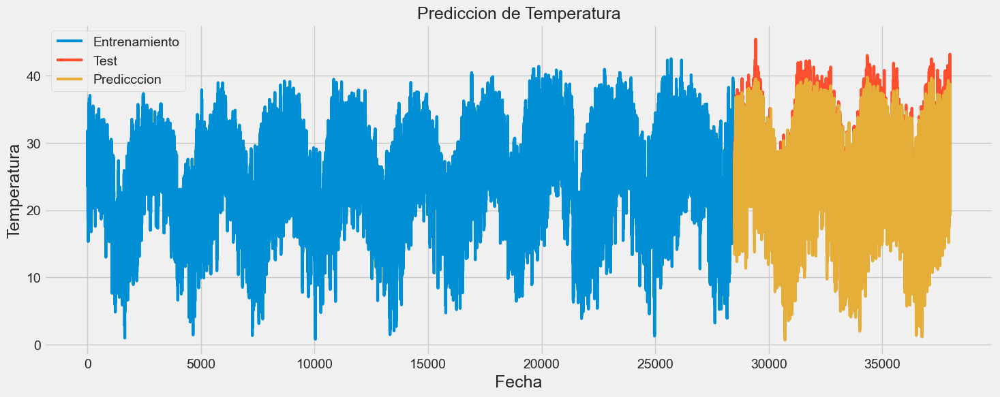

In [ ]:
train = dataset.iloc[:train_size , 0:1]
test = dataset.iloc[train_size: , 0:1]
test['Predictions'] = predictions

plt.figure(figsize= (16, 6))
plt.title('Prediccion de Temperatura', fontsize= 18)
plt.xlabel('Fecha', fontsize= 18)
plt.ylabel('Temperatura', fontsize= 18)
plt.plot(train['Temperatura'], linewidth= 3)
plt.plot(test['Temperatura'], linewidth= 3)
plt.plot(test["Predictions"], linewidth= 3)
plt.legend(['Entrenamiento', 'Test', 'Predicccion'])

In [ ]:
history_new = model.fit(
    x_train, y_train,
    validation_data=(x_val, y_val),
    epochs=100,
    batch_size=32,
    callbacks=[early_stopping],  # Agregar el callback
    verbose=1
)


Epoch 1/100
949/949 ━━━━━━━━━━━━━━━━━━━━ 28s 30ms/step - loss: 0.0017 - mean_absolute_error: 0.0316 - r2_score: 0.9245 - rmse: 0.0406 - val_loss: 0.0013 - val_mean_absolute_error: 0.0264 - val_r2_score: -inf - val_rmse: 0.0358
Epoch 2/100
949/949 ━━━━━━━━━━━━━━━━━━━━ 30s 31ms/step - loss: 0.0017 - mean_absolute_error: 0.0320 - r2_score: 0.9236 - rmse: 0.0410 - val_loss: 0.0012 - val_mean_absolute_error: 0.0248 - val_r2_score: -inf - val_rmse: 0.0336
Epoch 3/100
949/949 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0017 - mean_absolute_error: 0.0314 - r2_score: 0.9241 - rmse: 0.0403 - val_loss: 0.0014 - val_mean_absolute_error: 0.0283 - val_r2_score: -inf - val_rmse: 0.0372
Epoch 4/100
949/949 ━━━━━━━━━━━━━━━━━━━━ 33s 35ms/step - loss: 0.0017 - mean_absolute_error: 0.0318 - r2_score: 0.9237 - rmse: 0.0407 - val_loss: 0.0011 - val_mean_absolute_error: 0.0235 - val_r2_score: -inf - val_rmse: 0.0326
Epoch 5/100
949/949 ━━━━━━━━━━━━━━━━━━━━ 32s 34ms/step - loss: 0.0017 - mean_absolute_error:

In [ ]:
# Combinar las pérdidas de entrenamiento
history.history['mean_absolute_error'].extend(history_new.history['mean_absolute_error'])
history.history['val_mean_absolute_error'].extend(history_new.history['val_mean_absolute_error'])
history.history['loss'].extend(history_new.history['loss'])
# Si tienes métricas de validación
if 'val_loss' in history.history:
    history.history['val_loss'].extend(history_new.history['val_loss'])



In [ ]:
# Get Prediction
predictions = model.predict(x_test)

297/297 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step


In [ ]:
#inverse predictions scaling
predictions = scaler.inverse_transform(predictions)
predictions.shape

(9496, 1)

In [ ]:
RMSE = np.sqrt(np.mean( y_test - predictions )**2).round(2)
RMSE

0.06

In [ ]:
preds_acts = pd.DataFrame(data={'Predictions':predictions.flatten(), 'Actuals':y_test.flatten()})
preds_acts

,Predictions,Actuals
0,28.071962,30.098930
1,28.009954,24.963581
2,23.380205,21.271733
3,18.974291,19.939433
4,22.050837,18.228108
...,...,...
9491,20.710352,21.719499
9492,28.522490,29.548918
9493,36.939590,40.026148
9494,39.765068,41.244712


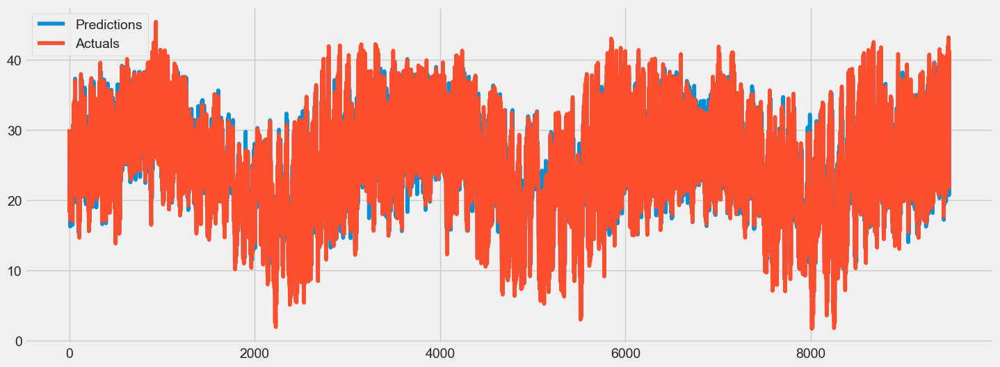

In [ ]:
plt.figure(figsize = (16, 6))
plt.plot(preds_acts['Predictions'])
plt.plot(preds_acts['Actuals'])
plt.legend(['Predictions', 'Actuals'])
plt.show()

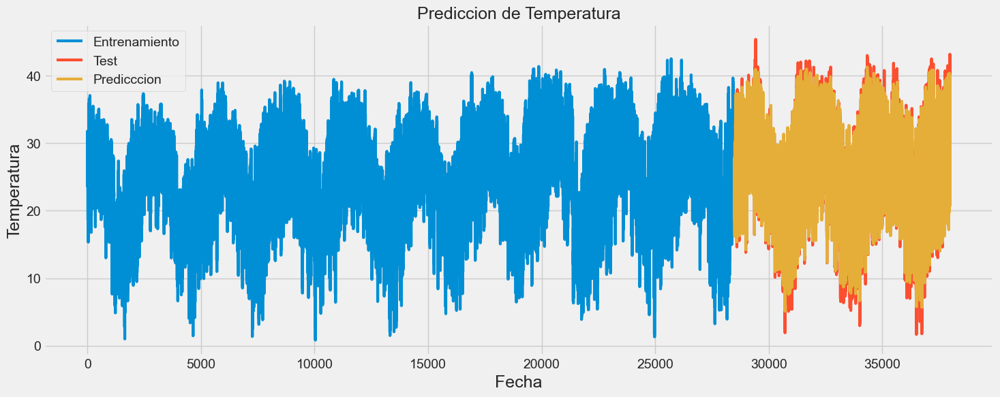

In [ ]:
train = dataset.iloc[:train_size , 0:1]
test = dataset.iloc[train_size: , 0:1]
test['Predictions'] = predictions

plt.figure(figsize= (16, 6))
plt.title('Prediccion de Temperatura', fontsize= 18)
plt.xlabel('Fecha', fontsize= 18)
plt.ylabel('Temperatura', fontsize= 18)
plt.plot(train['Temperatura'], linewidth= 3)
plt.plot(test['Temperatura'], linewidth= 3)
plt.plot(test["Predictions"], linewidth= 3)
plt.legend(['Entrenamiento', 'Test', 'Predicccion'])

In [ ]:
model.save('lstm_Gustavofinal.keras')

# ARIMA

In [23]:
import optuna
from sklearn.metrics import mean_absolute_error
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima.model import ARIMA
from optuna.samplers import TPESampler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [54]:
import seaborn as sns
import datetime as dt

import plotly
import plotly.express as px
import plotly.graph_objects as go
import cufflinks as cf


import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (10,6)

sns.set_style("whitegrid")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Set it None to display all rows in the dataframe
# pd.set_option('display.max_rows', None)

# Set it to None to display all columns in the dataframe
pd.set_option('display.max_columns', None)

### Analisis de datos

In [25]:
data_dir = 'https://raw.githubusercontent.com/GuztavoZimmIA/PrediccionDeTemperatura/refs/heads/main/DATASET/Temp_Asu20092021.csv'
df = pd.read_csv(data_dir, 
                 parse_dates=['Fecha'],  
                 index_col="Fecha")

In [26]:
df

,Unnamed: 0,Temperatura,Humedad
Fecha,,,
2009-01-01 00:00:00,0,26.749483,69.609451
2009-01-01 03:00:00,1,25.956114,78.225166
2009-01-01 06:00:00,2,23.707357,93.551756
2009-01-01 09:00:00,3,23.726823,93.394817
2009-01-01 12:00:00,4,29.606379,72.155839
...,...,...,...
2021-12-31 09:00:00,37979,21.719499,85.092387
2021-12-31 12:00:00,37980,29.548918,53.780205
2021-12-31 15:00:00,37981,40.026148,27.392646


In [60]:
df["year"] = df.index.year
df['month'] = df.index.month 
df['day'] = df.index.day
df['dayofweek'] = df.index.dayofweek
df["date"] = df.index.date

df.head()

,Unnamed: 0,Temperatura,Humedad,year,month,day,dayofweek,date
Fecha,,,,,,,,
2009-01-01 00:00:00,0,26.749,69.609,2009,1,1,3,2009-01-01
2009-01-01 03:00:00,1,25.956,78.225,2009,1,1,3,2009-01-01
2009-01-01 06:00:00,2,23.707,93.552,2009,1,1,3,2009-01-01
2009-01-01 09:00:00,3,23.727,93.395,2009,1,1,3,2009-01-01
2009-01-01 12:00:00,4,29.606,72.156,2009,1,1,3,2009-01-01


In [62]:
# creating dark gray template(xgridoff_dark) from xgridoff template: 

import plotly.io as pio

# Get the 'xgridoff' template
xgridoff_template = pio.templates['xgridoff']

# Customize the template for dark mode
xgridoff_template.layout.paper_bgcolor = 'rgb(25, 25, 25)'  # very dark gray background
xgridoff_template.layout.plot_bgcolor = 'rgb(35, 35, 35)'  # Dark gray plot background

xgridoff_template.layout.font.color = 'lightgray'  # Light gray font color

# Adjust gridline color and width
xgridoff_template.layout.xaxis.gridcolor = 'rgba(200, 200, 200, 0.3)'  # Light gray with transparency
xgridoff_template.layout.yaxis.gridcolor = 'rgba(200, 200, 200, 0.3)'  # Light gray with transparency
xgridoff_template.layout.xaxis.gridwidth = 1  # Set gridline width
xgridoff_template.layout.yaxis.gridwidth = 1  # Set gridline width

# Update Plotly templates with the modified 'xgridoff' template
pio.templates['xgridoff_dark'] = xgridoff_template

In [64]:
fig_meantemp = px.line(df, x=df.index, y='Temperatura', title='Temperatura en el tiempo')
fig_meantemp.update_layout(template='xgridoff_dark', title_x=0.5, xaxis_title="Date")
fig_meantemp.show()

fig_humidity = px.line(df, x=df.index, y='Humedad', title='Humedad en el tiempo')
fig_humidity.update_layout(template='xgridoff_dark', title_x=0.5, xaxis_title="Date")
fig_humidity.show()



In [67]:
from statsmodels.tsa.seasonal import seasonal_decompose
import plotly.subplots as sp

# Perform seasonal decomposition
result = seasonal_decompose(df['Temperatura'], model='additive', period=365)

# Plot the decomposed components
fig = sp.make_subplots(rows=4, cols=1, shared_xaxes=True, 
                       subplot_titles=['Observed', 'Trend', 'Seasonal', 'Residual'])

fig.add_trace(go.Scatter(x=df.index, y=result.observed, mode='lines', name='Observed'), row=1, col=1)
fig.add_trace(go.Scatter(x=df.index, y=result.trend, mode='lines', name='Trend'), row=2, col=1)
fig.add_trace(go.Scatter(x=df.index, y=result.seasonal, mode='lines', name='Seasonal'), row=3, col=1)
fig.add_trace(go.Scatter(x=df.index, y=result.resid, mode='lines', name='Residual'), row=4, col=1)

fig.update_layout(template= 'xgridoff_dark',height=800, title='Seasonal Decomposition of Mean Temperature')
fig.show()

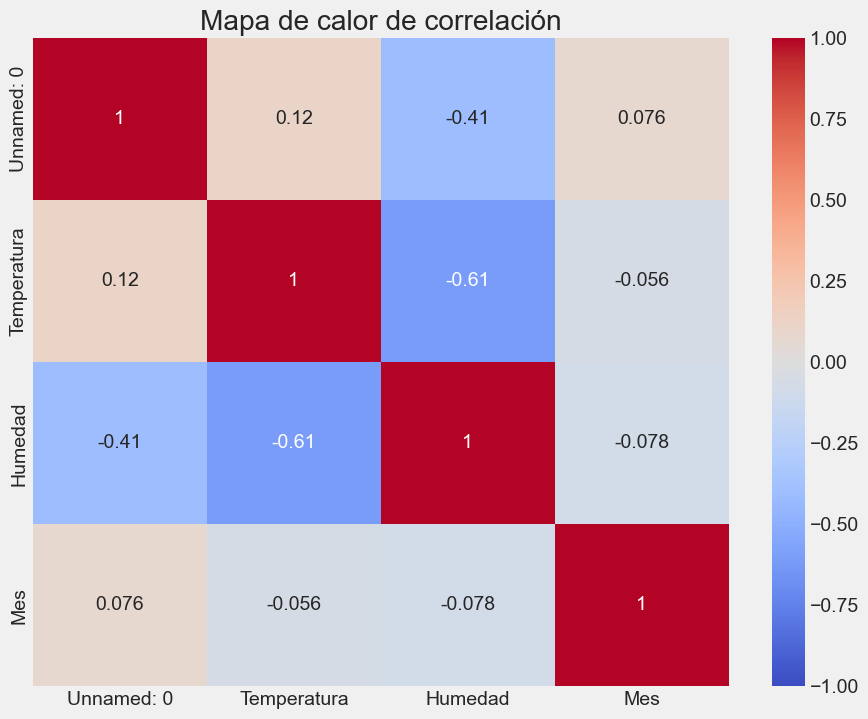

NameError: name 'X_test' is not defined

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Combinar X_test y y_test en un solo DataFrame
df_corr =  df # Agregar la variable objetivo
df_corr['Mes'] = df.index.month 
# Mapa de calor de correlación
plt.figure(figsize=(10, 8))
sns.heatmap(df_corr.corr(), annot=True, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Mapa de calor de correlación")
plt.show()

# Graficos de dispersión entre cada variable independiente y AC_POWER
for col in X_test.columns:
    plt.figure()
    sns.scatterplot(x=df_corr[col], y=df_corr['Temperatura'])
    plt.title(f"Temperatura vs {col}")
    plt.xlabel(col)
    plt.ylabel("Temperatura")
    plt.show()


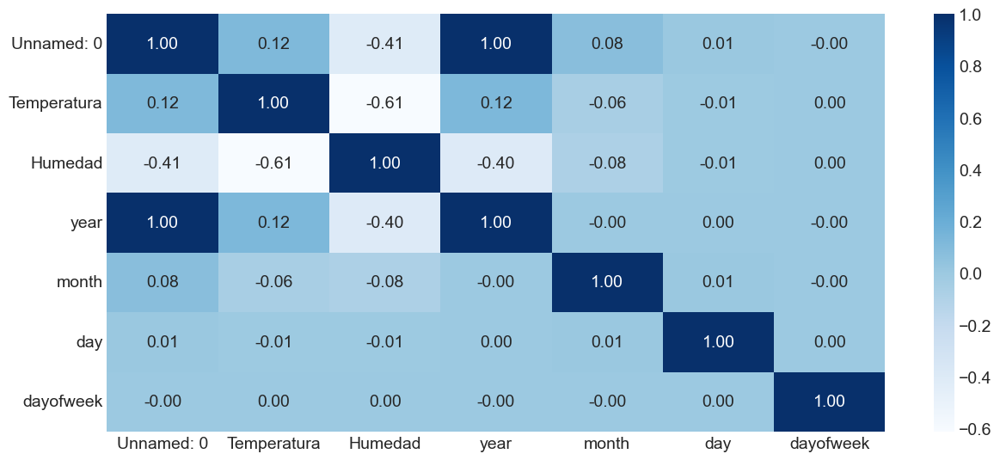

In [68]:
plt.figure(figsize=(13, 6))

sns.heatmap(df.select_dtypes('number').corr(), cmap='Blues', annot=True, fmt='.2f');

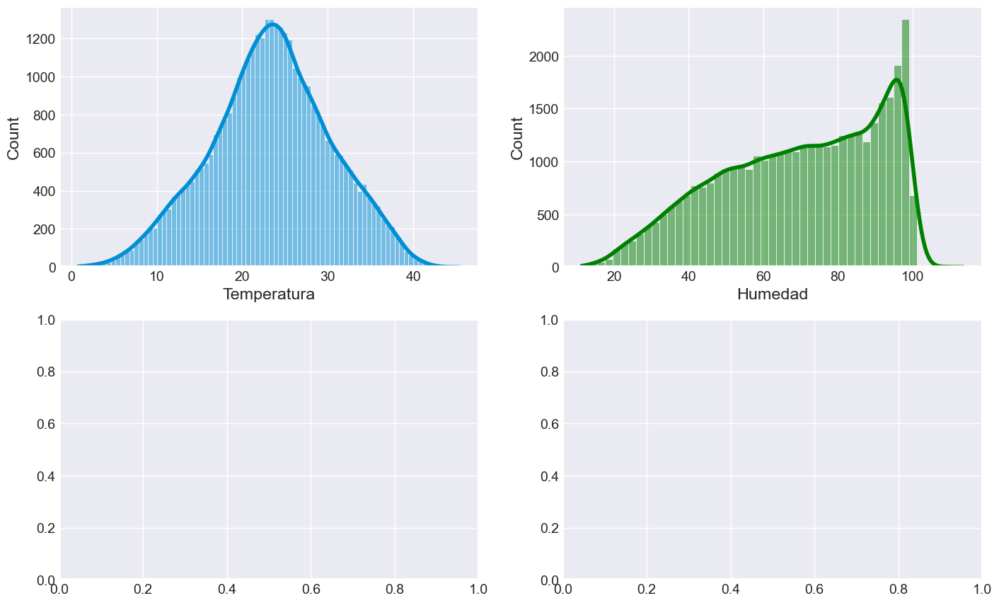

In [75]:
sns.set_style('darkgrid')

# Create subplots
fig, ax = plt.subplots(2, 2, figsize=(15, 10))

# Plot histograms with KDE
sns.histplot(data=df, x="Temperatura", ax=ax[0][0], kde=True)

sns.histplot(data=df, x="Humedad", ax=ax[0][1], kde=True, color='green')



# Show the plot
plt.show()

### Datos de entrenamiento

In [78]:
df1 = df.copy()
df1 = df1[['Temperatura', 'Humedad']]
df.head()

,Unnamed: 0,Temperatura,Humedad,year,month,day,dayofweek,date
Fecha,,,,,,,,
2009-01-01 00:00:00,0,26.749,69.609,2009,1,1,3,2009-01-01
2009-01-01 03:00:00,1,25.956,78.225,2009,1,1,3,2009-01-01
2009-01-01 06:00:00,2,23.707,93.552,2009,1,1,3,2009-01-01
2009-01-01 09:00:00,3,23.727,93.395,2009,1,1,3,2009-01-01
2009-01-01 12:00:00,4,29.606,72.156,2009,1,1,3,2009-01-01


Analizando estacionalidad

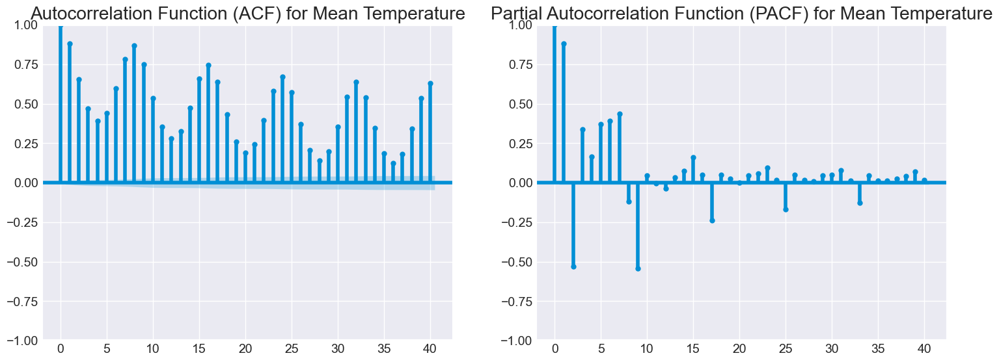

In [79]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot ACF
plot_acf(df1['Temperatura'], ax=axes[0], lags=40, title='Autocorrelation Function (ACF) for Mean Temperature')

# Plot PACF
plot_pacf(df1['Temperatura'], ax=axes[1], lags=40, title='Partial Autocorrelation Function (PACF) for Mean Temperature')

plt.show()

In [80]:
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, kpss

def check_stationarity(series):
    print(f'\n___________________Checking Stationarity for: {series.name}___________________\n')
    
    # ADF Test
    adf_test = adfuller(series.values)
    print('ADF Test:\n')
    print('ADF Statistic: %f' % adf_test[0])
    print('p-value: %f' % adf_test[1])
    print('Critical Values:')
    for key, value in adf_test[4].items():
        print('\t%s: %.3f' % (key, value))

    if (adf_test[1] <= 0.05) & (adf_test[4]['5%'] > adf_test[0]):
        print("\u001b[32mSeries is Stationary (ADF Test)\u001b[0m")
    else:
        print("\x1b[31mSeries is Non-stationary (ADF Test)\x1b[0m")
    
    print('\n' + '-'*50 + '\n')
    
    # KPSS Test
    kpss_test = kpss(series.values, regression='c', nlags='auto')
    print('KPSS Test:\n')
    print('KPSS Statistic: %f' % kpss_test[0])
    print('p-value: %f' % kpss_test[1])
    print('Critical Values:')
    for key, value in kpss_test[3].items():
        print('\t%s: %.3f' % (key, value))

    if kpss_test[1] > 0.05:
        print("\u001b[32mSeries is Stationary (KPSS Test)\u001b[0m")
    else:
        print("\x1b[31mSeries is Non-stationary (KPSS Test)\x1b[0m")

In [ ]:
# Check initial stationarity for each feature

check_stationarity(df1['Temperatura'])  # target is non stationary!!



___________________Checking Stationarity for: Temperatura___________________

ADF Test:

ADF Statistic: -11.557097
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Series is Stationary (ADF Test)

--------------------------------------------------

KPSS Test:

KPSS Statistic: 1.250064
p-value: 0.010000
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Series is Non-stationary (KPSS Test)

___________________Checking Stationarity for: Humedad___________________

ADF Test:

ADF Statistic: -10.724067
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Series is Stationary (ADF Test)

--------------------------------------------------

KPSS Test:

KPSS Statistic: 14.657862
p-value: 0.010000
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Series is Non-stationary (KPSS Test)


In [82]:
check_stationarity(df1['Humedad'])


___________________Checking Stationarity for: Humedad___________________

ADF Test:

ADF Statistic: -10.724067
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
Series is Stationary (ADF Test)

--------------------------------------------------

KPSS Test:

KPSS Statistic: 14.657862
p-value: 0.010000
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Series is Non-stationary (KPSS Test)


### Entrenamiento

In [83]:
# Split the data into training and testing sets
train_size = int(len(df1) * 0.8)
train, test = df1.iloc[:train_size], df1.iloc[train_size:]

In [85]:
display(f'Train shape: {train.shape}')
display(train.head())

display(f'Test shape: {test.shape}')
test.head()

'Train shape: (30387, 2)'

,Temperatura,Humedad
Fecha,,
2009-01-01 00:00:00,26.749,69.609
2009-01-01 03:00:00,25.956,78.225
2009-01-01 06:00:00,23.707,93.552
2009-01-01 09:00:00,23.727,93.395
2009-01-01 12:00:00,29.606,72.156


'Test shape: (7597, 2)'

,Temperatura,Humedad
Fecha,,
2019-05-27 09:00:00,20.658,81.190
2019-05-27 12:00:00,21.136,84.889
2019-05-27 15:00:00,27.039,67.960
2019-05-27 18:00:00,24.630,82.897
2019-05-27 21:00:00,21.975,98.569


Test MSE: 57.497


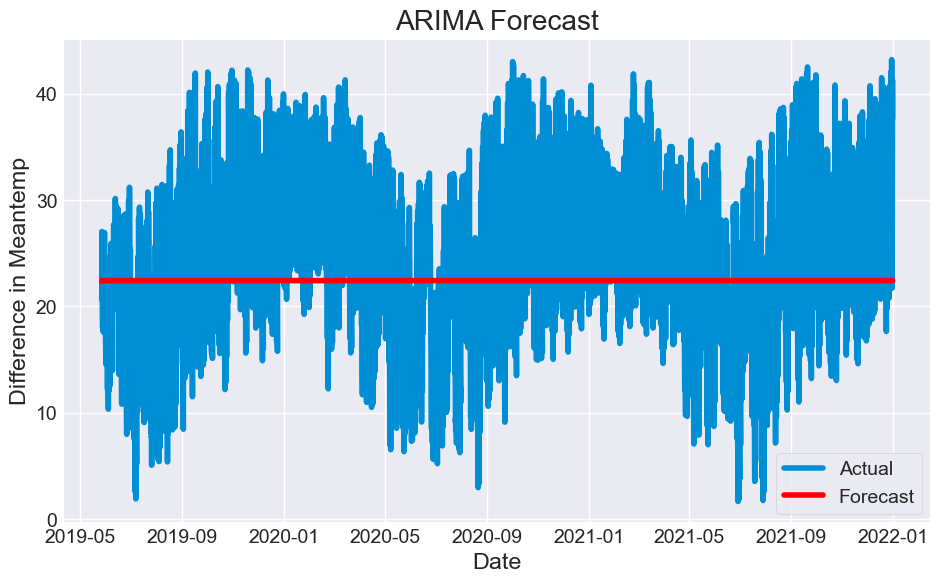

In [87]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Fit the ARIMA model
arima_model = ARIMA(train['Temperatura'], order=(1,1,1))  # ARIMA(p,d,q)
arima_model_fit = arima_model.fit()

# Make predictions
arima_pred = arima_model_fit.forecast(steps=len(test))

# Calculate error
error = mean_squared_error(test['Temperatura'], arima_pred)
print('Test MSE: %.3f' % error)

# Plot the results
plt.plot(test.index, test['Temperatura'], label='Actual')
plt.plot(test.index, arima_pred, color='red', label='Forecast')
plt.xlabel('Date')
plt.ylabel('Difference in Meantemp')
plt.title('ARIMA Forecast')
plt.legend()
plt.show()


*Hemos visto que el modelo ARIMA simple no es adecuado para estos datos (hay estacionalidad en nuestros datos)*

# SARIMA

*Se utilizan los mismo datos que para ARIMA*

### Entrenamiento con datos diarios

Test MSE: 37.768304277757935
Test R²: 0.324


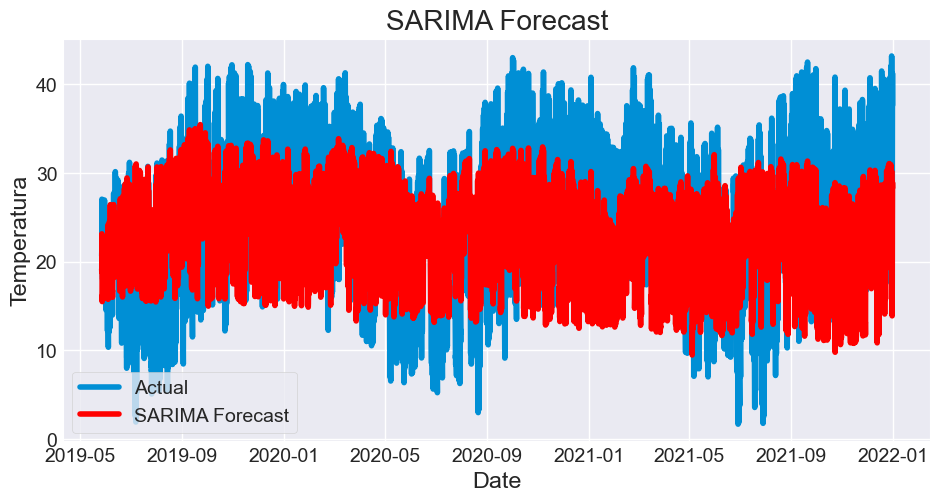

In [98]:
# SARIMAX

from statsmodels.tsa.statespace.sarimax import SARIMAX

# Define the SARIMA model parameters
order = (1, 1, 6)  # Non-seasonal order (p, d, q)
seasonal_order = (1, 1, 1, 7)  # Seasonal order (P, D, Q, S)  

# Fit the SARIMA model
sarima_model = SARIMAX(endog=train['Temperatura'], exog=train[['Humedad']],
                       order=order, seasonal_order=seasonal_order)
sarima_model_fit_total = sarima_model.fit()

# Make predictions
sarima_pred = sarima_model_fit_total.predict(start=test.index[0], end=test.index[-1],
                                            exog=test[['Humedad']])

# Calculate error
mse = mean_squared_error(test['Temperatura'], sarima_pred)
r2 = r2_score(test['Temperatura'], sarima_pred)
print('Test MSE:', mse)
print('Test R²: %.3f' % r2)

# Plot the results
plt.figure(figsize=(10, 5))
plt.plot(test.index, test['Temperatura'], label='Actual')
plt.plot(test.index, sarima_pred, color='red', label='SARIMA Forecast')
plt.xlabel('Date')
plt.ylabel('Temperatura')
plt.title('SARIMA Forecast')
plt.legend()
plt.show()

*Para las predicciones diarias, utilizar un parámetro de estacionalidad de 365 no es práctico ya que aumenta significativamente el tiempo de cálculo del modelo. En su lugar, agregaremos los datos a valores mensuales para realizar predicciones.*

### Entrenamiento con datos mensuales

In [89]:
monthly_df = df1.resample('M').mean()

# Split the data into training and testing sets
train_size = int(len(monthly_df) * 0.8)
m_train, m_test = monthly_df.iloc[:train_size], monthly_df.iloc[train_size:]

Test MSE: 2.2082165025295124
Test R²: 0.858


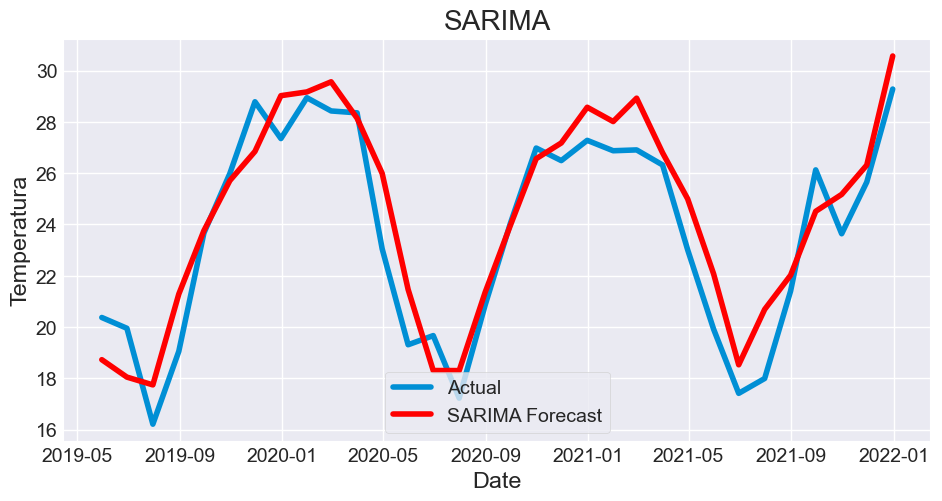

In [97]:
# SARIMA

from statsmodels.tsa.statespace.sarimax import SARIMAX

# Define the SARIMA model parameters
order = (1, 0, 0)  # Non-seasonal order (p, d, q)
seasonal_order = (2, 1, 1, 12)  # Seasonal order (P, D, Q, S)  

# Fit the SARIMA model
sarima_model = SARIMAX(endog=m_train['Temperatura'], exog=m_train[['Humedad']],
                       order=order, seasonal_order=seasonal_order)
sarima_model_fit = sarima_model.fit()

# Make predictions
sarima_pred_m = sarima_model_fit.predict(start=m_test.index[0], end=m_test.index[-1],
                                            exog=m_test[['Humedad']])

# Calculate error
mse = mean_squared_error(m_test['Temperatura'], sarima_pred_m)
r2 = r2_score(m_test['Temperatura'], sarima_pred_m)
print('Test MSE:', mse)
print('Test R²: %.3f' % r2)

# Plot the results
plt.figure(figsize=(10, 5))
plt.plot(m_test.index, m_test['Temperatura'], label='Actual')
plt.plot(m_test.index, sarima_pred_m, color='red', label='SARIMA Forecast')
plt.xlabel('Date')
plt.ylabel('Temperatura')
plt.title('SARIMA')
plt.legend()
plt.show()

In [101]:
# Guardar el modelo
import joblib
joblib.dump(sarima_model_fit, 'sarima_model_month.pkl')
joblib.dump(arima_model_fit, 'arima_model.pkl')
joblib.dump(sarima_model_fit_total, 'sarima_model_daily.pkl')

['sarima_model_daily.pkl']

# **Analisis de datos**

### COMPARANDO LOS TRES MODELOS

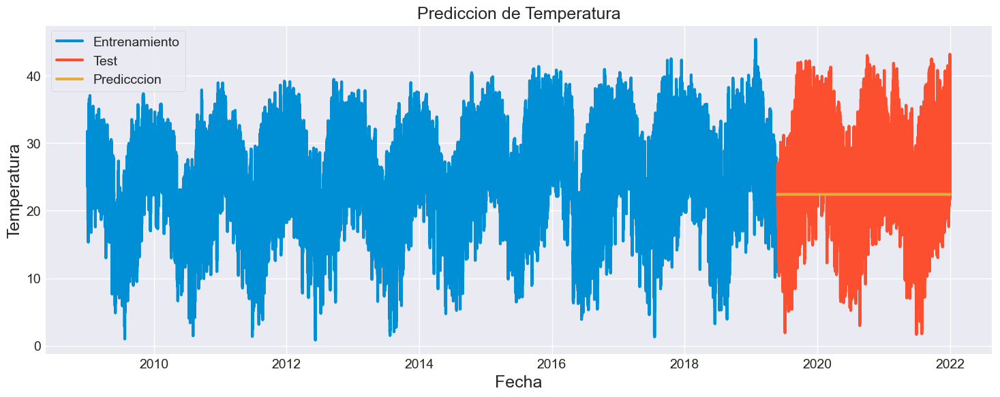

In [95]:
predictionsARI = arima_model_fit.forecast(steps=len(test))
test['Predictions'] = predictionsARI

plt.figure(figsize= (16, 6))
plt.title('Prediccion de Temperatura', fontsize= 18)
plt.xlabel('Fecha', fontsize= 18)
plt.ylabel('Temperatura', fontsize= 18)
plt.plot(train['Temperatura'], linewidth= 3)
plt.plot(test['Temperatura'], linewidth= 3)
plt.plot(test["Predictions"], linewidth= 3)
plt.legend(['Entrenamiento', 'Test', 'Predicccion'])

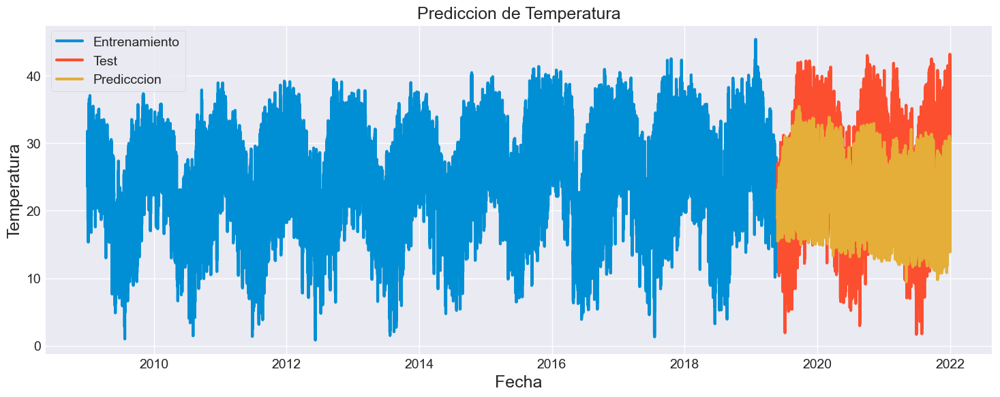

In [99]:
predictionsSARI = sarima_model_fit_total.predict(start=test.index[0], end=test.index[-1],
                                            exog=test[['Humedad']])


test['PredictionsSARI'] = predictionsSARI

plt.figure(figsize= (16, 6))
plt.title('Prediccion de Temperatura', fontsize= 18)
plt.xlabel('Fecha', fontsize= 18)
plt.ylabel('Temperatura', fontsize= 18)
plt.plot(train['Temperatura'], linewidth= 3)
plt.plot(test['Temperatura'], linewidth= 3)
plt.plot(test["PredictionsSARI"], linewidth= 3)
plt.legend(['Entrenamiento', 'Test', 'Predicccion'])